In [1]:
pip install ydata-profiling

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install ipywidgets

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install imblearn

In [1]:
import pandas as pd
df = pd.read_csv("application_record.csv")

In [2]:
df2 = pd.read_csv("credit_record.csv")

In [4]:
df.describe(include='all')

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
count,4.385570e+05,438557,438557,438557,438557.000000,4.385570e+05,438557,438557,438557,438557,438557.000000,438557.000000,438557.0,438557.000000,438557.000000,438557.000000,304354,438557.000000
unique,NaN,2,2,2,NaN,NaN,5,5,5,6,NaN,NaN,NaN,NaN,NaN,NaN,18,NaN
top,NaN,F,N,Y,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,NaN,NaN,NaN,NaN,Laborers,NaN
freq,NaN,294440,275459,304074,NaN,NaN,226104,301821,299828,393831,NaN,NaN,NaN,NaN,NaN,NaN,78240,NaN
mean,6.022176e+06,NaN,NaN,NaN,0.427390,1.875243e+05,NaN,NaN,NaN,NaN,-15997.904649,60563.675328,1.0,0.206133,0.287771,0.108207,NaN,2.194465
std,5.716370e+05,NaN,NaN,NaN,0.724882,1.100869e+05,NaN,NaN,NaN,NaN,4185.030007,138767.799647,0.0,0.404527,0.452724,0.310642,NaN,0.897207
min,5.008804e+06,NaN,NaN,NaN,0.000000,2.610000e+04,NaN,NaN,NaN,NaN,-25201.000000,-17531.000000,1.0,0.000000,0.000000,0.000000,NaN,1.000000
25%,5.609375e+06,NaN,NaN,NaN,0.000000,1.215000e+05,NaN,NaN,NaN,NaN,-19483.000000,-3103.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000
50%,6.047745e+06,NaN,NaN,NaN,0.000000,1.607805e+05,NaN,NaN,NaN,NaN,-15630.000000,-1467.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000
75%,6.456971e+06,NaN,NaN,NaN,1.000000,2.250000e+05,NaN,NaN,NaN,NaN,-12514.000000,-371.000000,1.0,0.000000,1.000000,0.000000,NaN,3.000000


In [5]:
df.shape

(438557, 18)

In [6]:
df2.describe(include='all')

,ID,MONTHS_BALANCE,STATUS
count,1.048575e+06,1.048575e+06,1048575
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,442031
mean,5.068286e+06,-1.913700e+01,NaN
std,4.615058e+04,1.402350e+01,NaN
min,5.001711e+06,-6.000000e+01,NaN
25%,5.023644e+06,-2.900000e+01,NaN
50%,5.062104e+06,-1.700000e+01,NaN
75%,5.113856e+06,-7.000000e+00,NaN


In [7]:
df2.shape

(1048575, 3)

In [89]:
from ydata_profiling import ProfileReport

In [9]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile = ProfileReport(df2)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
#each customer transaction history
grouped=df2.groupby('ID')['STATUS'].value_counts()
grouped

ID       STATUS
5001711  0          3
         X          1
5001712  0         10
         C          9
5001713  X         22
                   ..
5150483  X         18
5150484  0         12
         C          1
5150485  0          2
5150487  C         30
Name: STATUS, Length: 94143, dtype: int64

<AxesSubplot: xlabel='STATUS'>

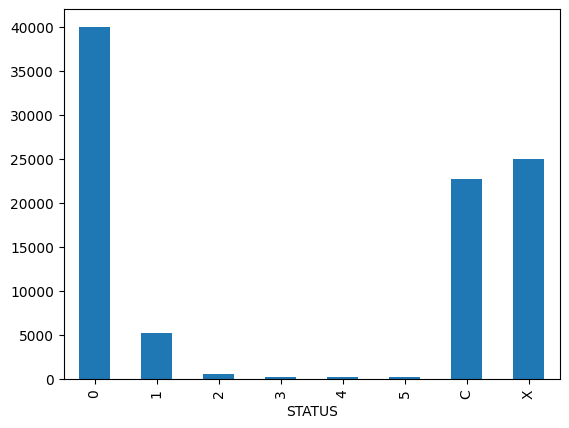

In [9]:
z=grouped.groupby('STATUS').count()
z.plot(kind='bar')

#most customer had past due record of 1-29 days (0)
#second high is customer without a balance - did not use the card (X)
#third high is customer paid off the balance that month (C)
#low presentage on delinquent (1-5) 


In [3]:
history=pd.get_dummies(data=df2,columns=['STATUS'],
                              prefix='',prefix_sep='').groupby('ID')[sorted(df2['STATUS'].unique().tolist())].sum()
history=history.rename(columns=
                      {'0':'pastdue',
                       '1':'30+',
                       '2':'60+',
                       '3':'90+',
                       '4':'120+',
                       '5':'150+',
                       'C':'paid_off',
                       'X':'no_usage',
                      })

overall_pastdue=['30+',	'60+',	'90+'	,'120+',	'150+']
history['number_of_months']=df2.groupby('ID')['MONTHS_BALANCE'].count()
history['over_90']=history[['90+','120+','150+']].sum(axis=1)
history['less_90']=history[['pastdue','30+','60+']].sum(axis=1)
history['overall_pastdue']=history[overall_pastdue].sum(axis=1)
history['pastdue_ratio']=round(history['pastdue']/ history['number_of_months'], 2)
history['overdue_ratio']=round(history['overall_pastdue']/ history['number_of_months'], 2)
history.head()

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio
ID,,,,,,,,,,,,,,
5001711,3,0,0,0,0,0,0,1,4,0,3,0,0.75,0.0
5001712,10,0,0,0,0,0,9,0,19,0,10,0,0.53,0.0
5001713,0,0,0,0,0,0,0,22,22,0,0,0,0.00,0.0
5001714,0,0,0,0,0,0,0,15,15,0,0,0,0.00,0.0
5001715,0,0,0,0,0,0,0,60,60,0,0,0,0.00,0.0


In [74]:
history.sum()

pastdue              383120.00
30+                   11090.00
60+                     868.00
90+                     320.00
120+                    223.00
150+                   1693.00
paid_off             442031.00
no_usage             209230.00
number_of_months    1048575.00
over_90                2236.00
less_90              395078.00
overall_pastdue       14194.00
pastdue_ratio         21215.32
overdue_ratio           667.91
class                 41558.00
dtype: float64

In [73]:
history.head(20)

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
ID,,,,,,,,,,,,,,,
5001711,3,0,0,0,0,0,0,1,4,0,3,0,0.75,0.00,1
5001712,10,0,0,0,0,0,9,0,19,0,10,0,0.53,0.00,1
5001713,0,0,0,0,0,0,0,22,22,0,0,0,0.00,0.00,0
5001714,0,0,0,0,0,0,0,15,15,0,0,0,0.00,0.00,0
5001715,0,0,0,0,0,0,0,60,60,0,0,0,0.00,0.00,0
5001717,17,0,0,0,0,0,5,0,22,0,17,0,0.77,0.00,1
5001718,24,2,0,0,0,0,3,10,39,0,26,2,0.62,0.05,1
5001719,2,0,0,0,0,0,41,0,43,0,2,0,0.05,0.00,1
5001720,29,7,0,0,0,0,0,0,36,0,36,7,0.81,0.19,0


In [4]:
#specify dependent variable 
target=[]
for index,row in history.iterrows() :
  if row['number_of_months'] < 6 :
    target.append(1)
  elif row['150+'] > 0 or (row['no_usage'] == row['number_of_months']) or (row['over_90'] > row['less_90']):
    target.append(0)
  elif row['pastdue_ratio'] > 0.70 and row['overall_pastdue'] >= 1 :
    target.append(0) 
  elif row['overdue_ratio'] > 0.10 and row['over_90'] >= 1 :
    target.append(0)
  else:
    target.append(1)

history['class']=target
history['class'].value_counts()

1    40200
0     5785
Name: class, dtype: int64

In [79]:
#unbalance set
history.describe()

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
count,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000
mean,8.331412,0.241166,0.018876,0.006959,0.004849,0.036816,9.612504,4.549962,22.802544,0.048625,8.591454,0.308666,0.461353,0.014525,0.874198
std,8.234128,0.990994,0.197607,0.101931,0.084188,0.855981,13.625156,9.622719,15.492771,0.935266,8.442478,1.512753,0.348173,0.061086,0.331630
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,3.000000,0.000000,0.150000,0.000000,1.000000
50%,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,19.000000,0.000000,6.000000,0.000000,0.410000,0.000000,1.000000
75%,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.000000,3.000000,34.000000,0.000000,12.000000,0.000000,0.800000,0.000000,1.000000
max,61.000000,38.000000,8.000000,8.000000,7.000000,48.000000,60.000000,61.000000,61.000000,48.000000,61.000000,49.000000,1.000000,1.000000,1.000000


In [92]:
df.duplicated().sum()

0

In [5]:
#merging 2 sets
features=['no_usage','number_of_months','over_90','less_90','overall_pastdue','pastdue_ratio','overdue_ratio','class']
new_features=history.loc[:,features]
mdf=pd.merge(df,new_features,on='ID')
mdf.index=mdf['ID']
mdf.drop('ID',axis=1, inplace=True)
mdf.drop_duplicates(inplace=True)
mdf.head()


,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,...,OCCUPATION_TYPE,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
ID,,,,,,,,,,,,,,,,,,,,,
5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,...,NaN,2.0,1,16,0,2,1,0.06,0.06,1
5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,...,NaN,2.0,1,15,0,2,1,0.07,0.07,1
5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,...,Security staff,2.0,16,30,0,7,0,0.23,0.00,1
5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,...,Sales staff,1.0,3,5,0,2,0,0.40,0.00,1
5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,...,Sales staff,1.0,5,5,0,0,0,0.00,0.00,1


In [94]:
mdf.duplicated().sum()


0

In [96]:
mdf.describe()

,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
count,30537.000000,3.053700e+04,30537.000000,30537.000000,30537.0,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000,30537.000000
mean,0.427907,1.867250e+05,-15982.492714,58913.724138,1.0,0.227855,0.295445,0.092118,2.198972,4.088843,22.388447,0.060680,8.481874,0.341815,0.462412,0.016215,0.882667
std,0.746653,1.011290e+05,4197.295214,137344.739349,0.0,0.419455,0.456250,0.289197,0.913487,8.836050,15.125662,0.994558,8.131223,1.591154,0.346641,0.066069,0.321822
min,0.000000,2.700000e+04,-25152.000000,-15713.000000,1.0,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.215000e+05,-19441.000000,-3163.000000,1.0,0.000000,0.000000,0.000000,2.000000,0.000000,10.000000,0.000000,3.000000,0.000000,0.150000,0.000000,1.000000
50%,0.000000,1.575000e+05,-15578.000000,-1552.000000,1.0,0.000000,0.000000,0.000000,2.000000,1.000000,19.000000,0.000000,6.000000,0.000000,0.410000,0.000000,1.000000
75%,1.000000,2.250000e+05,-12477.000000,-410.000000,1.0,0.000000,1.000000,0.000000,3.000000,3.000000,33.000000,0.000000,11.000000,0.000000,0.800000,0.000000,1.000000
max,19.000000,1.575000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000,61.000000,61.000000,48.000000,61.000000,49.000000,1.000000,1.000000,1.000000


In [101]:
mdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30537 entries, 5008804 to 5150337
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          30537 non-null  object 
 1   FLAG_OWN_CAR         30537 non-null  object 
 2   FLAG_OWN_REALTY      30537 non-null  object 
 3   CNT_CHILDREN         30537 non-null  int64  
 4   AMT_INCOME_TOTAL     30537 non-null  float64
 5   NAME_INCOME_TYPE     30537 non-null  object 
 6   NAME_EDUCATION_TYPE  30537 non-null  object 
 7   NAME_FAMILY_STATUS   30537 non-null  object 
 8   NAME_HOUSING_TYPE    30537 non-null  object 
 9   DAYS_BIRTH           30537 non-null  int64  
 10  DAYS_EMPLOYED        30537 non-null  int64  
 11  FLAG_MOBIL           30537 non-null  int64  
 12  FLAG_WORK_PHONE      30537 non-null  int64  
 13  FLAG_PHONE           30537 non-null  int64  
 14  FLAG_EMAIL           30537 non-null  int64  
 15  OCCUPATION_TYPE      30537 n

In [98]:
mdf.corr()

/var/folders/0h/ryslf10s1c12hsb45x6nnj0c0000gn/T/ipykernel_5046/2632886291.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mdf.corr()


,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
CNT_CHILDREN,1.000000,0.029845,0.335072,-0.226616,NaN,0.041995,-0.021877,0.015515,0.890418,-0.001916,-0.006402,-0.001496,0.002289,0.006519,0.001961,0.003251,-0.008424
AMT_INCOME_TOTAL,0.029845,1.000000,0.066394,-0.168678,NaN,-0.033334,0.017287,0.094698,0.020871,0.025747,0.023974,0.009642,0.041301,0.016189,0.004478,0.013161,-0.036609
DAYS_BIRTH,0.335072,0.066394,1.000000,-0.614392,NaN,0.179841,-0.028041,0.105310,0.298083,-0.012933,-0.059289,-0.010360,-0.038398,0.017845,-0.004920,0.031417,-0.011685
DAYS_EMPLOYED,-0.226616,-0.168678,-0.614392,1.000000,NaN,-0.243659,-0.008205,-0.085018,-0.220233,-0.003313,-0.006456,0.005289,-0.015028,-0.013582,-0.000221,-0.016955,0.012329
FLAG_MOBIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FLAG_WORK_PHONE,0.041995,-0.033334,0.179841,-0.243659,NaN,1.000000,0.308065,-0.034274,0.058080,0.014666,0.015496,0.007205,0.003035,0.012348,-0.015213,0.006198,-0.001115
FLAG_PHONE,-0.021877,0.017287,-0.028041,-0.008205,NaN,0.308065,1.000000,0.014622,-0.012660,0.019077,0.017005,0.011658,0.020899,0.005149,0.000697,0.001095,-0.011246
FLAG_EMAIL,0.015515,0.094698,0.105310,-0.085018,NaN,-0.034274,0.014622,1.000000,0.010821,-0.003792,0.005116,-0.003039,0.023570,0.003023,0.008472,0.009884,-0.005609
CNT_FAM_MEMBERS,0.890418,0.020871,0.298083,-0.220233,NaN,0.058080,-0.012660,0.010821,1.000000,0.006034,0.012177,-0.001503,0.013157,0.004509,-0.000761,0.000167,-0.007139
no_usage,-0.001916,0.025747,-0.012933,-0.003313,NaN,0.014666,0.019077,-0.003792,0.006034,1.000000,0.274482,-0.000222,-0.207403,-0.041042,-0.383350,-0.070949,-0.475954


In [99]:
profile = ProfileReport(mdf)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
#deal with missing values
mdf['OCCUPATION_TYPE'].fillna('Other',inplace=True)

In [7]:
#dropping constant value column 
mdf=mdf.drop(['FLAG_MOBIL'], axis=1) 

In [8]:
#change all datatype to numeric
#balancing the dataset SMOTE
y = mdf['class']
x = mdf.drop(columns=['class'],axis=1)
y.value_counts()


1    26954
0     3583
Name: class, dtype: int64

In [12]:
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
x_smoted, y_smoted = oversample.fit_resample(x,y)
y_smoted = pd.Series(y_smoted)
y_smoted.value_counts()

ValueError: could not convert string to float: 'M'